## Import packages 

In [57]:
import esda
from pysal import weights
import splot

import numpy as np
import pandas as pd
import geopandas as gpd

import os

import shapely
from shapely.geometry import Point, Polygon

import matplotlib.pyplot as plt
import contextily as ctx
import seaborn as sns

shapely.speedups.enable()

from tqdm import tqdm

import hvplot
import hvplot.pandas
import hvplot.xarray

%matplotlib inline

In [58]:
from model import swmmtb as st
import theinputerpy as inp
from model import sections as sec

from model import analysis as an

## Import data
Results from location sensitivity analysis simulations

In [59]:
use=[100]
use_all=[0,100]

In [60]:
storms=['M2y10h','M5y10h','M10y10h','M30y10h','M50y10h','M100y10h','M1000y10h','M10000y10h']

In [61]:
areas=pd.read_csv('model/building_areas')

In [62]:
subcat=list(areas['Name'])

In [63]:
for index, row in areas.iterrows():
    areas.loc[index, 'geometry']=shapely.wkt.loads(row['geometry'])
    
areas=gpd.GeoDataFrame(areas, crs='EPSG:27700', geometry='geometry')

In [8]:
from model import sections as sec

df=sec.import_inputfile('topsham_ag.inp')
inputer=sec.deteriminesections(df)

for index, row in inputer['subcatchments'].iterrows():
    inputer['subcatchments'].loc[index,'Name']=row['Name'].strip()

In [9]:
inputer['subcatchments']['%Imperv']=areas['%Imperv']

### Each GI separately

In [10]:
def use_one_green(typeGI):
    '''
    Functions imports data orgininated from the simulations & calculation of indicators
    Inputs
    -----
    typeGI: 'PerPav', 'BioCell', 'GreenRoof'
    
    Outputs
    -------
    use_gi: dictionary with pandas dataframes with results for each node, system, cso & wwtp
    
    '''
    use_gi=dict()

    for j in tqdm(use):
        use_gi[j]=dict()

        for i in tqdm(storms):
            use_gi[j][i]=dict()
            
            for n in tqdm(range(0,len(subcat))):
                flood=pd.read_csv('results/one/simulation_'+i+'_use'+str(j)+'_'+typeGI+'_'+str(n)+'_flood')
                flood['timestamp']=pd.to_datetime(flood['timestamp'])
                resilience=an.res_a(flood)

                res_system=an.res_sys(resilience)

                cso_flow=pd.read_csv('results/one/simulation_'+i+'_use'+str(j)+'_'+typeGI+'_'+str(n)+'_cso')
                cso_flow['timestamp']=pd.to_datetime(cso_flow['timestamp'])

                wwtp_flow=pd.read_csv('results/one/simulation_'+i+'_use'+str(j)+'_'+typeGI+'_'+str(n)+'_wwtp')
                wwtp_flow['timestamp']=pd.to_datetime(wwtp_flow['timestamp'])

                cso,wwtp=an.cso_wwtp(cso_flow,wwtp_flow)

                use_gi[j][i][n]=[flood,resilience, res_system, cso, wwtp]
    
    return use_gi

In [11]:
use_BC=use_one_green('BioCell')
use_GR=use_one_green('GreenRoof')
use_PP=use_one_green('PerPav')

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/220 [00:00<?, ?it/s]

  0%|          | 1/220 [00:00<00:24,  8.86it/s]

  1%|          | 2/220 [00:00<00:28,  7.69it/s]

  1%|▏         | 3/220 [00:00<00:26,  8.10it/s]

  2%|▏         | 4/220 [00:00<00:25,  8.39it/s]

  2%|▏         | 5/220 [00:00<00:24,  8.63it/s]

  3%|▎         | 6/220 [00:00<00:24,  8.78it/s]

  3%|▎         | 7/220 [00:00<00:23,  8.91it/s]

  4%|▎         | 8/220 [00:00<00:23,  9.01it/s]

  4%|▍         | 9/220 [00:01<00:23,  9.08it/s]

  5%|▍         | 10/220 [00:01<00:23,  9.10it/s]

  5%|▌         | 11/220 [00:01<00:22,  9.12it/s]

  5%|▌         | 12/220 [00:01<00:22,  9.15it/s]

  6%|▌         | 13/220 [00:01<00:22,  9.18it/s]

  6%|▋         | 14/220 [00:01<00:22,  9.19it/s]

  7%|▋         | 15/220 [00:01<00:22,  9.20it/s]

  7%|▋         | 16/220 [00:01<00:22,  9.20it/s]

  8%|▊         | 17/220 [00:01<00:22,  9.21it/s]

  8%|▊         | 18/220 [00:02<00:21,  9.21it/s]

  9%|▊         | 19/220 [00:0

 30%|███       | 67/220 [00:08<00:19,  7.99it/s]

 31%|███       | 68/220 [00:08<00:19,  7.97it/s]

 31%|███▏      | 69/220 [00:08<00:19,  7.94it/s]

 32%|███▏      | 70/220 [00:08<00:18,  7.95it/s]

 32%|███▏      | 71/220 [00:09<00:18,  7.96it/s]

 33%|███▎      | 72/220 [00:09<00:18,  7.96it/s]

 33%|███▎      | 73/220 [00:09<00:18,  7.95it/s]

 34%|███▎      | 74/220 [00:09<00:18,  7.94it/s]

 34%|███▍      | 75/220 [00:09<00:18,  7.95it/s]

 35%|███▍      | 76/220 [00:09<00:18,  7.98it/s]

 35%|███▌      | 77/220 [00:09<00:17,  7.98it/s]

 35%|███▌      | 78/220 [00:09<00:17,  7.97it/s]

 36%|███▌      | 79/220 [00:10<00:17,  7.99it/s]

 36%|███▋      | 80/220 [00:10<00:17,  7.97it/s]

 37%|███▋      | 81/220 [00:10<00:17,  8.01it/s]

 37%|███▋      | 82/220 [00:10<00:17,  8.02it/s]

 38%|███▊      | 83/220 [00:10<00:17,  8.03it/s]

 38%|███▊      | 84/220 [00:10<00:16,  8.03it/s]

 39%|███▊      | 85/220 [00:10<00:16,  8.04it/s]

 39%|███▉      | 86/220 [00:10<00:16,  8.03it/s]



 61%|██████    | 134/220 [00:18<00:11,  7.57it/s]

 61%|██████▏   | 135/220 [00:18<00:11,  7.54it/s]

 62%|██████▏   | 136/220 [00:18<00:11,  7.56it/s]

 62%|██████▏   | 137/220 [00:18<00:10,  7.58it/s]

 63%|██████▎   | 138/220 [00:18<00:10,  7.59it/s]

 63%|██████▎   | 139/220 [00:18<00:10,  7.59it/s]

 64%|██████▎   | 140/220 [00:18<00:10,  7.58it/s]

 64%|██████▍   | 141/220 [00:18<00:10,  7.59it/s]

 65%|██████▍   | 142/220 [00:19<00:10,  7.54it/s]

 65%|██████▌   | 143/220 [00:19<00:10,  7.55it/s]

 65%|██████▌   | 144/220 [00:19<00:10,  7.57it/s]

 66%|██████▌   | 145/220 [00:19<00:09,  7.57it/s]

 66%|██████▋   | 146/220 [00:19<00:09,  7.57it/s]

 67%|██████▋   | 147/220 [00:19<00:09,  7.58it/s]

 67%|██████▋   | 148/220 [00:19<00:09,  7.59it/s]

 68%|██████▊   | 149/220 [00:20<00:09,  7.60it/s]

 68%|██████▊   | 150/220 [00:20<00:09,  7.56it/s]

 69%|██████▊   | 151/220 [00:20<00:09,  7.57it/s]

 69%|██████▉   | 152/220 [00:20<00:08,  7.57it/s]

 70%|██████▉   | 153/220 [00:20

 91%|█████████▏| 201/220 [00:28<00:02,  7.12it/s]

 92%|█████████▏| 202/220 [00:28<00:02,  7.10it/s]

 92%|█████████▏| 203/220 [00:28<00:02,  7.09it/s]

 93%|█████████▎| 204/220 [00:29<00:02,  7.09it/s]

 93%|█████████▎| 205/220 [00:29<00:02,  7.09it/s]

 94%|█████████▎| 206/220 [00:29<00:01,  7.10it/s]

 94%|█████████▍| 207/220 [00:29<00:01,  7.10it/s]

 95%|█████████▍| 208/220 [00:29<00:01,  7.10it/s]

 95%|█████████▌| 209/220 [00:29<00:01,  7.10it/s]

 95%|█████████▌| 210/220 [00:29<00:01,  7.06it/s]

 96%|█████████▌| 211/220 [00:30<00:01,  7.08it/s]

 96%|█████████▋| 212/220 [00:30<00:01,  7.11it/s]

 97%|█████████▋| 213/220 [00:30<00:00,  7.10it/s]

 97%|█████████▋| 214/220 [00:30<00:00,  7.11it/s]

 98%|█████████▊| 215/220 [00:30<00:00,  7.09it/s]

 98%|█████████▊| 216/220 [00:30<00:00,  7.09it/s]

 99%|█████████▊| 217/220 [00:30<00:00,  7.11it/s]

 99%|█████████▉| 218/220 [00:31<00:00,  7.11it/s]

100%|█████████▉| 219/220 [00:31<00:00,  7.09it/s]

100%|██████████| 220/220 [00:31

 21%|██▏       | 47/220 [00:07<00:25,  6.77it/s]

 22%|██▏       | 48/220 [00:07<00:25,  6.78it/s]

 22%|██▏       | 49/220 [00:07<00:25,  6.79it/s]

 23%|██▎       | 50/220 [00:08<00:25,  6.79it/s]

 23%|██▎       | 51/220 [00:08<00:24,  6.79it/s]

 24%|██▎       | 52/220 [00:08<00:24,  6.78it/s]

 24%|██▍       | 53/220 [00:08<00:24,  6.76it/s]

 25%|██▍       | 54/220 [00:08<00:24,  6.75it/s]

 25%|██▌       | 55/220 [00:08<00:24,  6.73it/s]

 25%|██▌       | 56/220 [00:08<00:24,  6.74it/s]

 26%|██▌       | 57/220 [00:09<00:24,  6.75it/s]

 26%|██▋       | 58/220 [00:09<00:23,  6.77it/s]

 27%|██▋       | 59/220 [00:09<00:23,  6.79it/s]

 27%|██▋       | 60/220 [00:09<00:23,  6.76it/s]

 28%|██▊       | 61/220 [00:09<00:23,  6.76it/s]

 28%|██▊       | 62/220 [00:09<00:23,  6.77it/s]

 29%|██▊       | 63/220 [00:10<00:23,  6.77it/s]

 29%|██▉       | 64/220 [00:10<00:23,  6.78it/s]

 30%|██▉       | 65/220 [00:10<00:22,  6.78it/s]

 30%|███       | 66/220 [00:10<00:22,  6.77it/s]



 52%|█████▏    | 114/220 [00:19<00:17,  6.06it/s]

 52%|█████▏    | 115/220 [00:19<00:17,  6.06it/s]

 53%|█████▎    | 116/220 [00:19<00:17,  6.07it/s]

 53%|█████▎    | 117/220 [00:20<00:16,  6.06it/s]

 54%|█████▎    | 118/220 [00:20<00:16,  6.07it/s]

 54%|█████▍    | 119/220 [00:20<00:16,  6.05it/s]

 55%|█████▍    | 120/220 [00:20<00:16,  6.05it/s]

 55%|█████▌    | 121/220 [00:20<00:16,  6.04it/s]

 55%|█████▌    | 122/220 [00:20<00:16,  6.03it/s]

 56%|█████▌    | 123/220 [00:21<00:16,  6.03it/s]

 56%|█████▋    | 124/220 [00:21<00:15,  6.02it/s]

 57%|█████▋    | 125/220 [00:21<00:15,  6.03it/s]

 57%|█████▋    | 126/220 [00:21<00:15,  6.03it/s]

 58%|█████▊    | 127/220 [00:21<00:15,  6.03it/s]

 58%|█████▊    | 128/220 [00:21<00:15,  6.02it/s]

 59%|█████▊    | 129/220 [00:22<00:15,  6.02it/s]

 59%|█████▉    | 130/220 [00:22<00:15,  5.85it/s]

 60%|█████▉    | 131/220 [00:22<00:15,  5.92it/s]

 60%|██████    | 132/220 [00:22<00:14,  5.95it/s]

 60%|██████    | 133/220 [00:22

 82%|████████▏ | 180/220 [00:34<00:07,  5.25it/s]

 82%|████████▏ | 181/220 [00:34<00:07,  5.26it/s]

 83%|████████▎ | 182/220 [00:34<00:07,  5.26it/s]

 83%|████████▎ | 183/220 [00:34<00:07,  5.27it/s]

 84%|████████▎ | 184/220 [00:35<00:06,  5.28it/s]

 84%|████████▍ | 185/220 [00:35<00:06,  5.29it/s]

 85%|████████▍ | 186/220 [00:35<00:06,  5.29it/s]

 85%|████████▌ | 187/220 [00:35<00:06,  5.29it/s]

 85%|████████▌ | 188/220 [00:35<00:06,  5.29it/s]

 86%|████████▌ | 189/220 [00:35<00:05,  5.29it/s]

 86%|████████▋ | 190/220 [00:36<00:05,  5.28it/s]

 87%|████████▋ | 191/220 [00:36<00:05,  5.28it/s]

 87%|████████▋ | 192/220 [00:36<00:05,  5.28it/s]

 88%|████████▊ | 193/220 [00:36<00:05,  5.29it/s]

 88%|████████▊ | 194/220 [00:36<00:04,  5.29it/s]

 89%|████████▊ | 195/220 [00:37<00:04,  5.28it/s]

 89%|████████▉ | 196/220 [00:37<00:04,  5.29it/s]

 90%|████████▉ | 197/220 [00:37<00:04,  5.29it/s]

 90%|█████████ | 198/220 [00:37<00:04,  5.30it/s]

 90%|█████████ | 199/220 [00:37

 10%|█         | 23/220 [00:02<00:23,  8.38it/s]

 11%|█         | 24/220 [00:02<00:23,  8.37it/s]

 11%|█▏        | 25/220 [00:02<00:23,  8.37it/s]

 12%|█▏        | 26/220 [00:03<00:23,  8.37it/s]

 12%|█▏        | 27/220 [00:03<00:23,  8.37it/s]

 13%|█▎        | 28/220 [00:03<00:22,  8.36it/s]

 13%|█▎        | 29/220 [00:03<00:22,  8.40it/s]

 14%|█▎        | 30/220 [00:03<00:22,  8.38it/s]

 14%|█▍        | 31/220 [00:03<00:22,  8.38it/s]

 15%|█▍        | 32/220 [00:03<00:22,  8.39it/s]

 15%|█▌        | 33/220 [00:03<00:22,  8.39it/s]

 15%|█▌        | 34/220 [00:04<00:22,  8.41it/s]

 16%|█▌        | 35/220 [00:04<00:22,  8.38it/s]

 16%|█▋        | 36/220 [00:04<00:21,  8.39it/s]

 17%|█▋        | 37/220 [00:04<00:21,  8.38it/s]

 17%|█▋        | 38/220 [00:04<00:21,  8.37it/s]

 18%|█▊        | 39/220 [00:04<00:21,  8.38it/s]

 18%|█▊        | 40/220 [00:04<00:21,  8.37it/s]

 19%|█▊        | 41/220 [00:04<00:21,  8.40it/s]

 19%|█▉        | 42/220 [00:05<00:21,  8.40it/s]



 41%|████▏     | 91/220 [00:13<00:16,  7.60it/s]

 42%|████▏     | 92/220 [00:13<00:16,  7.62it/s]

 42%|████▏     | 93/220 [00:13<00:16,  7.62it/s]

 43%|████▎     | 94/220 [00:13<00:16,  7.63it/s]

 43%|████▎     | 95/220 [00:13<00:16,  7.62it/s]

 44%|████▎     | 96/220 [00:13<00:16,  7.62it/s]

 44%|████▍     | 97/220 [00:13<00:16,  7.64it/s]

 45%|████▍     | 98/220 [00:13<00:16,  7.62it/s]

 45%|████▌     | 99/220 [00:14<00:15,  7.63it/s]

 45%|████▌     | 100/220 [00:14<00:15,  7.67it/s]

 46%|████▌     | 101/220 [00:14<00:15,  7.61it/s]

 46%|████▋     | 102/220 [00:14<00:15,  7.58it/s]

 47%|████▋     | 103/220 [00:14<00:15,  7.57it/s]

 47%|████▋     | 104/220 [00:14<00:15,  7.56it/s]

 48%|████▊     | 105/220 [00:14<00:15,  7.55it/s]

 48%|████▊     | 106/220 [00:15<00:15,  7.53it/s]

 49%|████▊     | 107/220 [00:15<00:14,  7.54it/s]

 49%|████▉     | 108/220 [00:15<00:14,  7.56it/s]

 50%|████▉     | 109/220 [00:15<00:14,  7.55it/s]

 50%|█████     | 110/220 [00:15<00:14,  

 72%|███████▏  | 158/220 [00:21<00:08,  7.29it/s]

 72%|███████▏  | 159/220 [00:21<00:08,  7.28it/s]

 73%|███████▎  | 160/220 [00:21<00:08,  7.29it/s]

 73%|███████▎  | 161/220 [00:22<00:08,  7.29it/s]

 74%|███████▎  | 162/220 [00:22<00:07,  7.29it/s]

 74%|███████▍  | 163/220 [00:22<00:07,  7.28it/s]

 75%|███████▍  | 164/220 [00:22<00:07,  7.29it/s]

 75%|███████▌  | 165/220 [00:22<00:07,  7.29it/s]

 75%|███████▌  | 166/220 [00:22<00:07,  7.30it/s]

 76%|███████▌  | 167/220 [00:22<00:07,  7.30it/s]

 76%|███████▋  | 168/220 [00:23<00:07,  7.29it/s]

 77%|███████▋  | 169/220 [00:23<00:07,  7.25it/s]

 77%|███████▋  | 170/220 [00:23<00:06,  7.26it/s]

 78%|███████▊  | 171/220 [00:23<00:06,  7.23it/s]

 78%|███████▊  | 172/220 [00:23<00:06,  7.25it/s]

 79%|███████▊  | 173/220 [00:23<00:06,  7.25it/s]

 79%|███████▉  | 174/220 [00:23<00:06,  7.24it/s]

 80%|███████▉  | 175/220 [00:24<00:06,  7.25it/s]

 80%|████████  | 176/220 [00:24<00:06,  7.24it/s]

 80%|████████  | 177/220 [00:24

  1%|▏         | 3/220 [00:00<00:32,  6.77it/s]

  2%|▏         | 4/220 [00:00<00:31,  6.77it/s]

  2%|▏         | 5/220 [00:00<00:31,  6.77it/s]

  3%|▎         | 6/220 [00:00<00:31,  6.78it/s]

  3%|▎         | 7/220 [00:01<00:31,  6.77it/s]

  4%|▎         | 8/220 [00:01<00:31,  6.78it/s]

  4%|▍         | 9/220 [00:01<00:31,  6.78it/s]

  5%|▍         | 10/220 [00:01<00:30,  6.79it/s]

  5%|▌         | 11/220 [00:01<00:30,  6.80it/s]

  5%|▌         | 12/220 [00:01<00:30,  6.80it/s]

  6%|▌         | 13/220 [00:01<00:30,  6.82it/s]

  6%|▋         | 14/220 [00:02<00:30,  6.81it/s]

  7%|▋         | 15/220 [00:02<00:30,  6.81it/s]

  7%|▋         | 16/220 [00:02<00:29,  6.82it/s]

  8%|▊         | 17/220 [00:02<00:29,  6.82it/s]

  8%|▊         | 18/220 [00:02<00:29,  6.82it/s]

  9%|▊         | 19/220 [00:02<00:29,  6.80it/s]

  9%|▉         | 20/220 [00:02<00:29,  6.79it/s]

 10%|▉         | 21/220 [00:03<00:29,  6.80it/s]

 10%|█         | 22/220 [00:03<00:29,  6.79it/s]

 10%|█ 

 32%|███▏      | 71/220 [00:11<00:24,  5.97it/s]

 33%|███▎      | 72/220 [00:12<00:24,  5.97it/s]

 33%|███▎      | 73/220 [00:12<00:24,  5.96it/s]

 34%|███▎      | 74/220 [00:12<00:24,  5.96it/s]

 34%|███▍      | 75/220 [00:12<00:24,  5.95it/s]

 35%|███▍      | 76/220 [00:12<00:24,  5.97it/s]

 35%|███▌      | 77/220 [00:12<00:23,  5.97it/s]

 35%|███▌      | 78/220 [00:13<00:23,  5.96it/s]

 36%|███▌      | 79/220 [00:13<00:23,  5.97it/s]

 36%|███▋      | 80/220 [00:13<00:23,  5.98it/s]

 37%|███▋      | 81/220 [00:13<00:23,  5.99it/s]

 37%|███▋      | 82/220 [00:13<00:23,  5.97it/s]

 38%|███▊      | 83/220 [00:13<00:22,  5.96it/s]

 38%|███▊      | 84/220 [00:14<00:22,  5.97it/s]

 39%|███▊      | 85/220 [00:14<00:22,  5.97it/s]

 39%|███▉      | 86/220 [00:14<00:22,  5.97it/s]

 40%|███▉      | 87/220 [00:14<00:22,  5.97it/s]

 40%|████      | 88/220 [00:14<00:22,  5.97it/s]

 40%|████      | 89/220 [00:14<00:21,  5.97it/s]

 41%|████      | 90/220 [00:15<00:21,  5.96it/s]



 63%|██████▎   | 138/220 [00:26<00:15,  5.18it/s]

 63%|██████▎   | 139/220 [00:26<00:15,  5.17it/s]

 64%|██████▎   | 140/220 [00:27<00:15,  5.17it/s]

 64%|██████▍   | 141/220 [00:27<00:15,  5.18it/s]

 65%|██████▍   | 142/220 [00:27<00:15,  5.18it/s]

 65%|██████▌   | 143/220 [00:27<00:14,  5.18it/s]

 65%|██████▌   | 144/220 [00:27<00:14,  5.18it/s]

 66%|██████▌   | 145/220 [00:28<00:14,  5.15it/s]

 66%|██████▋   | 146/220 [00:28<00:14,  5.16it/s]

 67%|██████▋   | 147/220 [00:28<00:14,  5.16it/s]

 67%|██████▋   | 148/220 [00:28<00:13,  5.16it/s]

 68%|██████▊   | 149/220 [00:28<00:13,  5.17it/s]

 68%|██████▊   | 150/220 [00:29<00:13,  5.17it/s]

 69%|██████▊   | 151/220 [00:29<00:13,  5.18it/s]

 69%|██████▉   | 152/220 [00:29<00:13,  5.18it/s]

 70%|██████▉   | 153/220 [00:29<00:12,  5.19it/s]

 70%|███████   | 154/220 [00:29<00:12,  5.18it/s]

 70%|███████   | 155/220 [00:30<00:12,  5.17it/s]

 71%|███████   | 156/220 [00:30<00:12,  5.15it/s]

 71%|███████▏  | 157/220 [00:30

 27%|██▋       | 59/220 [00:06<00:17,  9.34it/s]

 27%|██▋       | 60/220 [00:06<00:17,  9.37it/s]

 28%|██▊       | 61/220 [00:06<00:16,  9.36it/s]

 28%|██▊       | 62/220 [00:06<00:16,  9.32it/s]

 29%|██▊       | 63/220 [00:06<00:16,  9.31it/s]

 29%|██▉       | 64/220 [00:06<00:16,  9.31it/s]

 30%|██▉       | 65/220 [00:07<00:16,  9.32it/s]

 30%|███       | 66/220 [00:07<00:16,  9.32it/s]

 30%|███       | 67/220 [00:07<00:16,  9.35it/s]

 31%|███       | 68/220 [00:07<00:16,  9.34it/s]

 31%|███▏      | 69/220 [00:07<00:16,  9.35it/s]

 32%|███▏      | 70/220 [00:07<00:16,  9.36it/s]

 32%|███▏      | 71/220 [00:07<00:15,  9.36it/s]

 33%|███▎      | 72/220 [00:07<00:15,  9.37it/s]

 33%|███▎      | 73/220 [00:07<00:15,  9.38it/s]

 34%|███▎      | 74/220 [00:07<00:15,  9.37it/s]

 34%|███▍      | 75/220 [00:08<00:15,  9.38it/s]

 35%|███▍      | 76/220 [00:08<00:15,  9.37it/s]

 35%|███▌      | 77/220 [00:08<00:15,  9.44it/s]

 35%|███▌      | 78/220 [00:08<00:15,  9.42it/s]



 57%|█████▋    | 126/220 [00:15<00:11,  8.31it/s]

 58%|█████▊    | 127/220 [00:15<00:11,  8.29it/s]

 58%|█████▊    | 128/220 [00:15<00:11,  8.30it/s]

 59%|█████▊    | 129/220 [00:15<00:10,  8.31it/s]

 59%|█████▉    | 130/220 [00:15<00:10,  8.31it/s]

 60%|█████▉    | 131/220 [00:15<00:10,  8.31it/s]

 60%|██████    | 132/220 [00:15<00:10,  8.30it/s]

 60%|██████    | 133/220 [00:15<00:10,  8.30it/s]

 61%|██████    | 134/220 [00:16<00:10,  8.30it/s]

 61%|██████▏   | 135/220 [00:16<00:10,  8.33it/s]

 62%|██████▏   | 136/220 [00:16<00:10,  8.33it/s]

 62%|██████▏   | 137/220 [00:16<00:09,  8.34it/s]

 63%|██████▎   | 138/220 [00:16<00:09,  8.35it/s]

 63%|██████▎   | 139/220 [00:16<00:09,  8.35it/s]

 64%|██████▎   | 140/220 [00:16<00:09,  8.36it/s]

 64%|██████▍   | 141/220 [00:16<00:09,  8.35it/s]

 65%|██████▍   | 142/220 [00:17<00:09,  8.35it/s]

 65%|██████▌   | 143/220 [00:17<00:09,  8.36it/s]

 65%|██████▌   | 144/220 [00:17<00:09,  8.36it/s]

 66%|██████▌   | 145/220 [00:17

 88%|████████▊ | 193/220 [00:24<00:03,  7.92it/s]

 88%|████████▊ | 194/220 [00:24<00:03,  7.90it/s]

 89%|████████▊ | 195/220 [00:24<00:03,  7.87it/s]

 89%|████████▉ | 196/220 [00:24<00:03,  7.86it/s]

 90%|████████▉ | 197/220 [00:24<00:02,  7.85it/s]

 90%|█████████ | 198/220 [00:25<00:02,  7.87it/s]

 90%|█████████ | 199/220 [00:25<00:02,  7.86it/s]

 91%|█████████ | 200/220 [00:25<00:02,  7.85it/s]

 91%|█████████▏| 201/220 [00:25<00:02,  7.86it/s]

 92%|█████████▏| 202/220 [00:25<00:02,  7.86it/s]

 92%|█████████▏| 203/220 [00:25<00:02,  7.86it/s]

 93%|█████████▎| 204/220 [00:25<00:02,  7.88it/s]

 93%|█████████▎| 205/220 [00:25<00:01,  7.88it/s]

 94%|█████████▎| 206/220 [00:26<00:01,  7.88it/s]

 94%|█████████▍| 207/220 [00:26<00:01,  7.89it/s]

 95%|█████████▍| 208/220 [00:26<00:01,  7.90it/s]

 95%|█████████▌| 209/220 [00:26<00:01,  7.90it/s]

 95%|█████████▌| 210/220 [00:26<00:01,  7.89it/s]

 96%|█████████▌| 211/220 [00:26<00:01,  7.88it/s]

 96%|█████████▋| 212/220 [00:26

 17%|█▋        | 38/220 [00:05<00:26,  6.96it/s]

 18%|█▊        | 39/220 [00:05<00:25,  6.97it/s]

 18%|█▊        | 40/220 [00:05<00:25,  6.98it/s]

 19%|█▊        | 41/220 [00:05<00:25,  6.99it/s]

 19%|█▉        | 42/220 [00:06<00:25,  6.99it/s]

 20%|█▉        | 43/220 [00:06<00:25,  6.98it/s]

 20%|██        | 44/220 [00:06<00:25,  6.99it/s]

 20%|██        | 45/220 [00:06<00:25,  6.96it/s]

 21%|██        | 46/220 [00:06<00:24,  6.98it/s]

 21%|██▏       | 47/220 [00:06<00:24,  6.98it/s]

 22%|██▏       | 48/220 [00:06<00:24,  6.98it/s]

 22%|██▏       | 49/220 [00:07<00:24,  6.99it/s]

 23%|██▎       | 50/220 [00:07<00:24,  7.00it/s]

 23%|██▎       | 51/220 [00:07<00:24,  6.98it/s]

 24%|██▎       | 52/220 [00:07<00:24,  6.98it/s]

 24%|██▍       | 53/220 [00:07<00:23,  6.98it/s]

 25%|██▍       | 54/220 [00:07<00:23,  6.97it/s]

 25%|██▌       | 55/220 [00:07<00:23,  6.98it/s]

 25%|██▌       | 56/220 [00:08<00:23,  6.99it/s]

 26%|██▌       | 57/220 [00:08<00:23,  6.98it/s]



 48%|████▊     | 105/220 [00:16<00:17,  6.60it/s]

 48%|████▊     | 106/220 [00:16<00:17,  6.58it/s]

 49%|████▊     | 107/220 [00:16<00:17,  6.59it/s]

 49%|████▉     | 108/220 [00:16<00:17,  6.59it/s]

 50%|████▉     | 109/220 [00:16<00:16,  6.56it/s]

 50%|█████     | 110/220 [00:16<00:16,  6.58it/s]

 50%|█████     | 111/220 [00:16<00:16,  6.55it/s]

 51%|█████     | 112/220 [00:17<00:16,  6.53it/s]

 51%|█████▏    | 113/220 [00:17<00:16,  6.51it/s]

 52%|█████▏    | 114/220 [00:17<00:16,  6.49it/s]

 52%|█████▏    | 115/220 [00:17<00:16,  6.51it/s]

 53%|█████▎    | 116/220 [00:17<00:16,  6.49it/s]

 53%|█████▎    | 117/220 [00:17<00:15,  6.52it/s]

 54%|█████▎    | 118/220 [00:18<00:15,  6.50it/s]

 54%|█████▍    | 119/220 [00:18<00:15,  6.48it/s]

 55%|█████▍    | 120/220 [00:18<00:15,  6.52it/s]

 55%|█████▌    | 121/220 [00:18<00:15,  6.52it/s]

 55%|█████▌    | 122/220 [00:18<00:15,  6.51it/s]

 56%|█████▌    | 123/220 [00:18<00:14,  6.54it/s]

 56%|█████▋    | 124/220 [00:18

 78%|███████▊  | 172/220 [00:29<00:08,  5.83it/s]

 79%|███████▊  | 173/220 [00:29<00:08,  5.86it/s]

 79%|███████▉  | 174/220 [00:29<00:07,  5.85it/s]

 80%|███████▉  | 175/220 [00:29<00:07,  5.83it/s]

 80%|████████  | 176/220 [00:29<00:07,  5.85it/s]

 80%|████████  | 177/220 [00:30<00:07,  5.86it/s]

 81%|████████  | 178/220 [00:30<00:07,  5.86it/s]

 81%|████████▏ | 179/220 [00:30<00:07,  5.84it/s]

 82%|████████▏ | 180/220 [00:30<00:06,  5.84it/s]

 82%|████████▏ | 181/220 [00:30<00:06,  5.86it/s]

 83%|████████▎ | 182/220 [00:30<00:06,  5.86it/s]

 83%|████████▎ | 183/220 [00:31<00:06,  5.84it/s]

 84%|████████▎ | 184/220 [00:31<00:06,  5.82it/s]

 84%|████████▍ | 185/220 [00:31<00:05,  5.84it/s]

 85%|████████▍ | 186/220 [00:31<00:05,  5.82it/s]

 85%|████████▌ | 187/220 [00:31<00:05,  5.82it/s]

 85%|████████▌ | 188/220 [00:31<00:05,  5.83it/s]

 86%|████████▌ | 189/220 [00:32<00:05,  5.84it/s]

 86%|████████▋ | 190/220 [00:32<00:05,  5.84it/s]

 87%|████████▋ | 191/220 [00:32

In [12]:
use_BC[0]=dict()

for i in tqdm(storms):
    flood=pd.read_csv('results/baseline/simulation_'+i+'_flood')
    flood['timestamp']=pd.to_datetime(flood['timestamp'])
    resilience=an.res_a(flood)

    res_system=an.res_sys(resilience)

    
    cso_flow=pd.read_csv('results/baseline/simulation_'+ i +'_cso')
    cso_flow['timestamp']=pd.to_datetime(cso_flow['timestamp'])

    wwtp_flow=pd.read_csv('results/baseline/simulation_'+ i +'_wwtp')
    wwtp_flow['timestamp']=pd.to_datetime(wwtp_flow['timestamp'])

    cso,wwtp=an.cso_wwtp(cso_flow,wwtp_flow)

    use_BC[0][i]=[flood,resilience, res_system, cso, wwtp]
    
use_GR[0]=dict()

for i in tqdm(storms):
    flood=pd.read_csv('results/baseline/simulation_'+i+'_flood')
    flood['timestamp']=pd.to_datetime(flood['timestamp'])
    resilience=an.res_a(flood)

    res_system=an.res_sys(resilience)

    cso_flow=pd.read_csv('results/baseline/simulation_'+ i +'_cso')
    cso_flow['timestamp']=pd.to_datetime(cso_flow['timestamp'])

    wwtp_flow=pd.read_csv('results/baseline/simulation_'+ i +'_wwtp')
    wwtp_flow['timestamp']=pd.to_datetime(wwtp_flow['timestamp'])

    cso,wwtp=an.cso_wwtp(cso_flow,wwtp_flow)

    use_GR[0][i]=[flood,resilience, res_system, cso, wwtp]

use_PP[0]=dict()

for i in tqdm(storms):
    flood=pd.read_csv('results/baseline/simulation_'+i+'_flood')
    flood['timestamp']=pd.to_datetime(flood['timestamp'])
    resilience=an.res_a(flood)

    res_system=an.res_sys(resilience)

    cso_flow=pd.read_csv('results/baseline/simulation_'+ i +'_cso')
    cso_flow['timestamp']=pd.to_datetime(cso_flow['timestamp'])

    wwtp_flow=pd.read_csv('results/baseline/simulation_'+ i +'_wwtp')
    wwtp_flow['timestamp']=pd.to_datetime(wwtp_flow['timestamp'])

    cso,wwtp=an.cso_wwtp(cso_flow,wwtp_flow)

    use_PP[0][i]=[flood,resilience, res_system, cso, wwtp]

100%|██████████| 8/8 [00:01<00:00,  6.89it/s]


### All GI together

In [13]:
def use_all_green(typeGI):
    '''
    Functions imports data orgininated from the simulations & calculation of indicators
    
    Outputs
    -------
    use_gi: dictionary with pandas dataframes with results for each node, system, cso & wwtp
    
    '''
    use_gi=dict()

    for j in tqdm(use):
        use_gi[j]=dict()

        for i in tqdm(storms):
            use_gi[j][i]=dict()
            
            for n in tqdm(range(0,len(subcat))):
                flood=pd.read_csv('results/all/simulation_'+i+'_use'+str(j)+'_'+typeGI+'_'+str(n)+'_flood')
                flood['timestamp']=pd.to_datetime(flood['timestamp'])
                resilience=an.res_a(flood)

                res_system=an.res_sys(resilience)

                cso_flow=pd.read_csv('results/all/simulation_'+i+'_use'+str(j)+'_'+typeGI+'_'+str(n)+'_cso')
                cso_flow['timestamp']=pd.to_datetime(cso_flow['timestamp'])

                wwtp_flow=pd.read_csv('results/all/simulation_'+i+'_use'+str(j)+'_'+typeGI+'_'+str(n)+'_wwtp')
                wwtp_flow['timestamp']=pd.to_datetime(wwtp_flow['timestamp'])

                cso,wwtp=an.cso_wwtp(cso_flow,wwtp_flow)

                use_gi[j][i][n]=[flood,resilience, res_system, cso, wwtp]
    
    return use_gi

In [128]:
use_all=use_all_green('all')

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/220 [00:00<?, ?it/s]

  0%|          | 1/220 [00:00<00:24,  9.01it/s]

  1%|          | 2/220 [00:00<00:24,  9.07it/s]

  1%|▏         | 3/220 [00:00<00:23,  9.08it/s]

  2%|▏         | 4/220 [00:00<00:23,  9.14it/s]

  2%|▏         | 5/220 [00:00<00:23,  9.18it/s]

  3%|▎         | 6/220 [00:00<00:23,  9.20it/s]

  3%|▎         | 7/220 [00:00<00:23,  9.21it/s]

  4%|▎         | 8/220 [00:00<00:22,  9.23it/s]

  4%|▍         | 9/220 [00:00<00:22,  9.23it/s]

  5%|▍         | 10/220 [00:01<00:22,  9.26it/s]

  5%|▌         | 11/220 [00:01<00:22,  9.25it/s]

  5%|▌         | 12/220 [00:01<00:22,  9.25it/s]

  6%|▌         | 13/220 [00:01<00:22,  9.25it/s]

  6%|▋         | 14/220 [00:01<00:22,  9.23it/s]

  7%|▋         | 15/220 [00:01<00:22,  9.23it/s]

  7%|▋         | 16/220 [00:01<00:22,  9.24it/s]

  8%|▊         | 17/220 [00:01<00:21,  9.25it/s]

  8%|▊         | 18/220 [00:01<00:21,  9.25it/s]

  9%|▊         | 19/220 [00:0

 30%|███       | 67/220 [00:08<00:18,  8.31it/s]

 31%|███       | 68/220 [00:08<00:18,  8.28it/s]

 31%|███▏      | 69/220 [00:08<00:18,  8.28it/s]

 32%|███▏      | 70/220 [00:08<00:18,  8.27it/s]

 32%|███▏      | 71/220 [00:08<00:18,  8.28it/s]

 33%|███▎      | 72/220 [00:08<00:17,  8.27it/s]

 33%|███▎      | 73/220 [00:08<00:17,  8.28it/s]

 34%|███▎      | 74/220 [00:08<00:17,  8.27it/s]

 34%|███▍      | 75/220 [00:09<00:17,  8.29it/s]

 35%|███▍      | 76/220 [00:09<00:17,  8.29it/s]

 35%|███▌      | 77/220 [00:09<00:17,  8.33it/s]

 35%|███▌      | 78/220 [00:09<00:17,  8.31it/s]

 36%|███▌      | 79/220 [00:09<00:16,  8.30it/s]

 36%|███▋      | 80/220 [00:09<00:16,  8.29it/s]

 37%|███▋      | 81/220 [00:09<00:16,  8.30it/s]

 37%|███▋      | 82/220 [00:09<00:16,  8.29it/s]

 38%|███▊      | 83/220 [00:10<00:16,  8.30it/s]

 38%|███▊      | 84/220 [00:10<00:16,  8.29it/s]

 39%|███▊      | 85/220 [00:10<00:16,  8.29it/s]

 39%|███▉      | 86/220 [00:10<00:16,  8.28it/s]



 61%|██████    | 134/220 [00:17<00:11,  7.71it/s]

 61%|██████▏   | 135/220 [00:17<00:10,  7.74it/s]

 62%|██████▏   | 136/220 [00:17<00:10,  7.75it/s]

 62%|██████▏   | 137/220 [00:17<00:10,  7.75it/s]

 63%|██████▎   | 138/220 [00:17<00:10,  7.69it/s]

 63%|██████▎   | 139/220 [00:17<00:10,  7.70it/s]

 64%|██████▎   | 140/220 [00:17<00:10,  7.72it/s]

 64%|██████▍   | 141/220 [00:18<00:10,  7.71it/s]

 65%|██████▍   | 142/220 [00:18<00:10,  7.72it/s]

 65%|██████▌   | 143/220 [00:18<00:09,  7.75it/s]

 65%|██████▌   | 144/220 [00:18<00:09,  7.75it/s]

 66%|██████▌   | 145/220 [00:18<00:09,  7.72it/s]

 66%|██████▋   | 146/220 [00:18<00:09,  7.65it/s]

 67%|██████▋   | 147/220 [00:18<00:09,  7.65it/s]

 67%|██████▋   | 148/220 [00:19<00:09,  7.66it/s]

 68%|██████▊   | 149/220 [00:19<00:09,  7.68it/s]

 68%|██████▊   | 150/220 [00:19<00:09,  7.70it/s]

 69%|██████▊   | 151/220 [00:19<00:08,  7.71it/s]

 69%|██████▉   | 152/220 [00:19<00:08,  7.70it/s]

 70%|██████▉   | 153/220 [00:19

 91%|█████████▏| 201/220 [00:27<00:02,  7.32it/s]

 92%|█████████▏| 202/220 [00:27<00:02,  7.32it/s]

 92%|█████████▏| 203/220 [00:27<00:02,  7.33it/s]

 93%|█████████▎| 204/220 [00:27<00:02,  7.34it/s]

 93%|█████████▎| 205/220 [00:27<00:02,  7.35it/s]

 94%|█████████▎| 206/220 [00:28<00:01,  7.35it/s]

 94%|█████████▍| 207/220 [00:28<00:01,  7.33it/s]

 95%|█████████▍| 208/220 [00:28<00:01,  7.33it/s]

 95%|█████████▌| 209/220 [00:28<00:01,  7.34it/s]

 95%|█████████▌| 210/220 [00:28<00:01,  7.34it/s]

 96%|█████████▌| 211/220 [00:28<00:01,  7.33it/s]

 96%|█████████▋| 212/220 [00:28<00:01,  7.36it/s]

 97%|█████████▋| 213/220 [00:29<00:00,  7.34it/s]

 97%|█████████▋| 214/220 [00:29<00:00,  7.36it/s]

 98%|█████████▊| 215/220 [00:29<00:00,  7.37it/s]

 98%|█████████▊| 216/220 [00:29<00:00,  7.36it/s]

 99%|█████████▊| 217/220 [00:29<00:00,  7.36it/s]

 99%|█████████▉| 218/220 [00:29<00:00,  7.39it/s]

100%|█████████▉| 219/220 [00:29<00:00,  7.38it/s]

100%|██████████| 220/220 [00:29

 21%|██▏       | 47/220 [00:06<00:25,  6.76it/s]

 22%|██▏       | 48/220 [00:07<00:25,  6.77it/s]

 22%|██▏       | 49/220 [00:07<00:25,  6.77it/s]

 23%|██▎       | 50/220 [00:07<00:25,  6.78it/s]

 23%|██▎       | 51/220 [00:07<00:24,  6.79it/s]

 24%|██▎       | 52/220 [00:11<03:43,  1.33s/it]

 24%|██▍       | 53/220 [00:11<02:43,  1.02it/s]

 25%|██▍       | 54/220 [00:11<02:00,  1.37it/s]

 25%|██▌       | 55/220 [00:12<01:31,  1.80it/s]

 25%|██▌       | 56/220 [00:12<01:11,  2.31it/s]

 26%|██▌       | 57/220 [00:12<00:56,  2.87it/s]

 26%|██▋       | 58/220 [00:12<00:46,  3.46it/s]

 27%|██▋       | 59/220 [00:12<00:39,  4.04it/s]

 27%|██▋       | 60/220 [00:12<00:34,  4.59it/s]

 28%|██▊       | 61/220 [00:12<00:31,  5.07it/s]

 28%|██▊       | 62/220 [00:13<00:28,  5.47it/s]

 29%|██▊       | 63/220 [00:13<00:27,  5.79it/s]

 29%|██▉       | 64/220 [00:13<00:25,  6.05it/s]

 30%|██▉       | 65/220 [00:13<00:24,  6.25it/s]

 30%|███       | 66/220 [00:13<00:24,  6.37it/s]



 52%|█████▏    | 114/220 [00:18<00:17,  6.00it/s]

 52%|█████▏    | 115/220 [00:19<00:17,  5.99it/s]

 53%|█████▎    | 116/220 [00:19<00:17,  5.99it/s]

 53%|█████▎    | 117/220 [00:19<00:17,  5.99it/s]

 54%|█████▎    | 118/220 [00:19<00:17,  5.99it/s]

 54%|█████▍    | 119/220 [00:19<00:16,  6.01it/s]

 55%|█████▍    | 120/220 [00:19<00:16,  6.03it/s]

 55%|█████▌    | 121/220 [00:20<00:16,  6.05it/s]

 55%|█████▌    | 122/220 [00:20<00:16,  6.05it/s]

 56%|█████▌    | 123/220 [00:20<00:16,  6.05it/s]

 56%|█████▋    | 124/220 [00:20<00:15,  6.04it/s]

 57%|█████▋    | 125/220 [00:20<00:15,  6.02it/s]

 57%|█████▋    | 126/220 [00:20<00:15,  6.01it/s]

 58%|█████▊    | 127/220 [00:21<00:15,  6.00it/s]

 58%|█████▊    | 128/220 [00:21<00:15,  6.01it/s]

 59%|█████▊    | 129/220 [00:21<00:15,  6.02it/s]

 59%|█████▉    | 130/220 [00:21<00:14,  6.02it/s]

 60%|█████▉    | 131/220 [00:21<00:14,  6.00it/s]

 60%|██████    | 132/220 [00:21<00:14,  6.01it/s]

 60%|██████    | 133/220 [00:22

 82%|████████▏ | 180/220 [00:34<00:07,  5.14it/s]

 82%|████████▏ | 181/220 [00:34<00:07,  5.15it/s]

 83%|████████▎ | 182/220 [00:35<00:07,  5.12it/s]

 83%|████████▎ | 183/220 [00:35<00:07,  5.13it/s]

 84%|████████▎ | 184/220 [00:35<00:07,  5.14it/s]

 84%|████████▍ | 185/220 [00:35<00:06,  5.15it/s]

 85%|████████▍ | 186/220 [00:35<00:06,  5.16it/s]

 85%|████████▌ | 187/220 [00:36<00:06,  5.17it/s]

 85%|████████▌ | 188/220 [00:36<00:06,  5.15it/s]

 86%|████████▌ | 189/220 [00:36<00:05,  5.17it/s]

 86%|████████▋ | 190/220 [00:36<00:05,  5.17it/s]

 87%|████████▋ | 191/220 [00:36<00:05,  5.19it/s]

 87%|████████▋ | 192/220 [00:37<00:05,  5.19it/s]

 88%|████████▊ | 193/220 [00:37<00:05,  5.19it/s]

 88%|████████▊ | 194/220 [00:37<00:05,  5.19it/s]

 89%|████████▊ | 195/220 [00:37<00:04,  5.18it/s]

 89%|████████▉ | 196/220 [00:37<00:04,  5.19it/s]

 90%|████████▉ | 197/220 [00:38<00:04,  5.20it/s]

 90%|█████████ | 198/220 [00:38<00:04,  5.20it/s]

 90%|█████████ | 199/220 [00:38

In [129]:
use_all[0]=dict()

for i in tqdm(storms):
    flood=pd.read_csv('results/baseline/simulation_'+i+'_flood')
    flood['timestamp']=pd.to_datetime(flood['timestamp'])
    resilience=an.res_a(flood)

    res_system=an.res_sys(resilience)

    cso_flow=pd.read_csv('results/baseline/simulation_'+ i +'_cso')
    cso_flow['timestamp']=pd.to_datetime(cso_flow['timestamp'])

    wwtp_flow=pd.read_csv('results/baseline/simulation_'+ i +'_wwtp')
    wwtp_flow['timestamp']=pd.to_datetime(wwtp_flow['timestamp'])

    cso,wwtp=an.cso_wwtp(cso_flow,wwtp_flow)

    use_all[0][i]=[flood,resilience, res_system, cso, wwtp]

100%|██████████| 8/8 [00:01<00:00,  7.00it/s]


# SEWER FLOOD

### Resilience indicators

In [16]:
def sys_resilience(use_gi):
    '''
    Organising the system resilience in a unique DataFrame
    Input
    -----
    use_gi: dictonary with all the data uploaded from simulations
    Output
    ------
    res_sy_gi: dictionary with dataframes for all the storms & uses
    '''
    
    res_sy_gi=dict()
    
    for j in use:
        res_sy_gi[j]=dict()
        for i in tqdm(storms):
            res_sy_gi[j][i]=pd.DataFrame()
            for n in tqdm(range(0,len(subcat))):
                res_sy_gi[j][i][n]=use_gi[j][i][n][2].T[0]
    
    return res_sy_gi

In [17]:
res_sy_BC=sys_resilience(use_BC)
res_sy_GR=sys_resilience(use_GR)
res_sy_PP=sys_resilience(use_PP)
res_sy_all=sys_resilience(use_all)

100%|██████████| 8/8 [00:00<00:00,  8.08it/s]


In [18]:
res_sy_BC[0]=dict()
res_sy_PP[0]=dict()
res_sy_GR[0]=dict()
res_sy_all[0]=dict()

for s in storms:
    res_sy_BC[0][s]=pd.DataFrame(use_BC[0][s][2].T[0])
    res_sy_PP[0][s]=pd.DataFrame(use_PP[0][s][2].T[0])
    res_sy_GR[0][s]=pd.DataFrame(use_GR[0][s][2].T[0])
    res_sy_all[0][s]=pd.DataFrame(use_all[0][s][2].T[0])

In [22]:
# Baseline - resilience area for the stresss-strain curve with no GI

In [19]:
baseline=pd.DataFrame()

for s in storms:
    baseline[s]=res_sy_BC[0][s][0]
    
baseline=baseline.rename(columns={'M2y10h':2,'M5y10h':5,'M10y10h':10,'M30y10h':30,'M50y10h':50,'M100y10h':100,'M1000y10h':1000,'M10000y10h':10000})

baseline=baseline.T

In [20]:
baseline=baseline.reset_index().rename(columns={'index':'%AEP'})

In [21]:
area_duration=np.trapz(x=baseline['%AEP'], y=baseline['Duration'])
area_magnitude=np.trapz(x=baseline['%AEP'], y=baseline['Severity'])

In [23]:
# Area under the strain-stress curve for the different interventions 
# Calculation of the NET CHANGE in resilience

In [25]:
subsi_BC=dict()
rel_res_BC=pd.DataFrame()
for sub in range(0,len(subcat)):
    
    subsi_BC[sub]=pd.DataFrame()
    
    for s in storms:
        subsi_BC[sub][s]=res_sy_BC[100][s][sub]
    
    subsi_BC[sub]=subsi_BC[sub].rename(columns={'M2y10h':2,'M5y10h':5,'M10y10h':10,'M30y10h':30,'M50y10h':50,'M100y10h':100,'M1000y10h':1000,'M10000y10h':10000})
    subsi_BC[sub]=subsi_BC[sub].T
    subsi_BC[sub]=subsi_BC[sub].reset_index().rename(columns={'index':'%AEP'})
    
    dur=100*(area_duration-np.trapz(x=subsi_BC[sub]['%AEP'], y=subsi_BC[sub]['Duration']))/area_duration
    sev=100*(area_magnitude-np.trapz(x=subsi_BC[sub]['%AEP'], y=subsi_BC[sub]['Severity']))/area_magnitude

    rel_res_BC[sub]=[dur,sev]

    
subsi_GR=dict()
rel_res_GR=pd.DataFrame()
for sub in range(0,len(subcat)):
    
    subsi_GR[sub]=pd.DataFrame()
    
    for s in storms:
        subsi_GR[sub][s]=res_sy_GR[100][s][sub]
    
    subsi_GR[sub]=subsi_GR[sub].rename(columns={'M2y10h':2,'M5y10h':5,'M10y10h':10,'M30y10h':30,'M50y10h':50,'M100y10h':100,'M1000y10h':1000,'M10000y10h':10000})

    subsi_GR[sub]=subsi_GR[sub].T
    subsi_GR[sub]=subsi_GR[sub].reset_index().rename(columns={'index':'%AEP'})
  

    
    dur=100*(area_duration-np.trapz(x=subsi_GR[sub]['%AEP'], y=subsi_GR[sub]['Duration']))/area_duration
    sev=100*(area_magnitude-np.trapz(x=subsi_GR[sub]['%AEP'], y=subsi_GR[sub]['Severity']))/area_magnitude

    rel_res_GR[sub]=[dur,sev]
    
    
subsi_PP=dict()
rel_res_PP=pd.DataFrame()
for sub in range(0,len(subcat)):
    
    subsi_PP[sub]=pd.DataFrame()
    
    for s in storms:
        subsi_PP[sub][s]=res_sy_PP[100][s][sub]
    
    subsi_PP[sub]=subsi_PP[sub].rename(columns={'M2y10h':2,'M5y10h':5,'M10y10h':10,'M30y10h':30,'M50y10h':50,'M100y10h':100,'M1000y10h':1000,'M10000y10h':10000})
    subsi_PP[sub]=subsi_PP[sub].T
    subsi_PP[sub]=subsi_PP[sub].reset_index().rename(columns={'index':'%AEP'})
    

    dur=100*(area_duration-np.trapz(x=subsi_PP[sub]['%AEP'], y=subsi_PP[sub]['Duration']))/area_duration
    sev=100*(area_magnitude-np.trapz(x=subsi_PP[sub]['%AEP'], y=subsi_PP[sub]['Severity']))/area_magnitude

    rel_res_PP[sub]=[dur,sev]
    
subsi_all=dict()
rel_res_all=pd.DataFrame()
for sub in range(0,len(subcat)):
    
    subsi_all[sub]=pd.DataFrame()
    
    for s in storms:
        subsi_all[sub][s]=res_sy_all[100][s][sub]
    
    subsi_all[sub]=subsi_all[sub].rename(columns={'M2y10h':2,'M5y10h':5,'M10y10h':10,'M30y10h':30,'M50y10h':50,'M100y10h':100,'M1000y10h':1000,'M10000y10h':10000})
    subsi_all[sub]=subsi_all[sub].T
    subsi_all[sub]=subsi_all[sub].reset_index().rename(columns={'index':'%AEP'})
    

    dur=100*(area_duration-np.trapz(x=subsi_all[sub]['%AEP'], y=subsi_all[sub]['Duration']))/area_duration
    sev=100*(area_magnitude-np.trapz(x=subsi_all[sub]['%AEP'], y=subsi_all[sub]['Severity']))/area_magnitude

    rel_res_all[sub]=[dur,sev]

In [26]:
rel_res_BC=rel_res_BC.T.rename(columns={0:'Duration',1:'Magnitude'})
rel_res_BC['geometry']=areas['geometry']
rel_res_BC=gpd.GeoDataFrame(rel_res_BC, crs='EPSG:27700')

rel_res_GR=rel_res_GR.T.rename(columns={0:'Duration',1:'Magnitude'})
rel_res_GR['geometry']=areas['geometry']
rel_res_GR=gpd.GeoDataFrame(rel_res_GR, crs='EPSG:27700')

rel_res_PP=rel_res_PP.T.rename(columns={0:'Duration',1:'Magnitude'})
rel_res_PP['geometry']=areas['geometry']
rel_res_PP=gpd.GeoDataFrame(rel_res_PP, crs='EPSG:27700')

rel_res_all=rel_res_all.T.rename(columns={0:'Duration',1:'Magnitude'})
rel_res_all['geometry']=areas['geometry']
rel_res_all=gpd.GeoDataFrame(rel_res_PP, crs='EPSG:27700')

In [268]:
resi_BC=rel_res_BC[['Duration','Magnitude']].copy()
resi_PP=rel_res_PP[['Duration','Magnitude']].copy()
resi_GR=rel_res_GR[['Duration','Magnitude']].copy()
resi_all=rel_res_all[['Duration','Magnitude']].copy()

resi_BC.loc[:,'GI']='BC'
resi_GR.loc[:,'GI']='GR'
resi_PP.loc[:,'GI']='PP'
resi_all.loc[:,'GI']='ALL'

rel_res=pd.concat([resi_BC, resi_GR,resi_PP,resi_all])

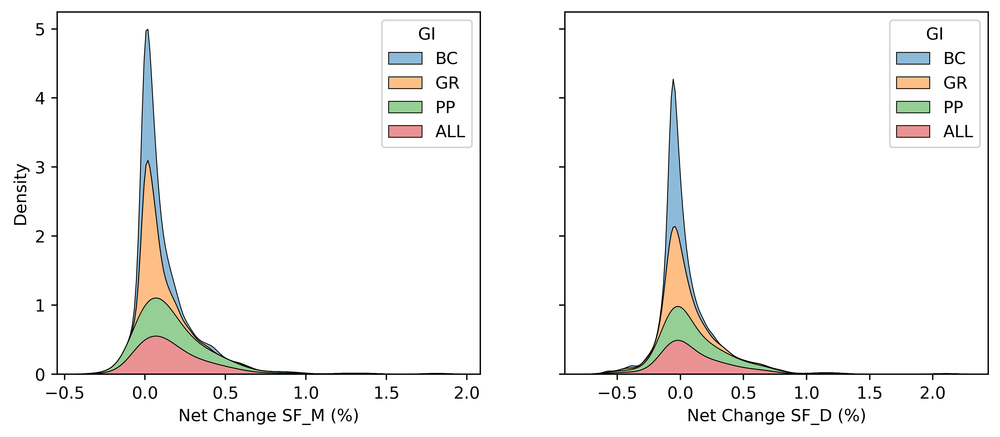

In [307]:
fig,ax=plt.subplots(1,2,dpi=500, sharey=True,figsize=(10,4))

sns.kdeplot(ax=ax[0],data=rel_res, x='Magnitude',hue='GI',fill=True,multiple='stack',linewidth=0.5, alpha=0.5)
sns.kdeplot(ax=ax[1],data=rel_res, x='Duration',hue='GI',fill=True,multiple='stack',linewidth=0.5, alpha=0.5)

ax[0].set_xlabel('Net Change SF_M (%)')
ax[1].set_xlabel('Net Change SF_D (%)')

plt.savefig('kdeplot_SF.png')

In [35]:
# fig, ax = plt.subplots(1,2, sharey=True)

rel_res_all.hvplot( c='Duration', scheme='BoxPlot',cmap='coolwarm',tiles='Wikipedia',crs='EPSG:27700')+rel_res_GR.hvplot(c='Magnitude', cmap='coolwarm',tiles='Wikipedia',crs='EPSG:27700')

:Layout
   .Overlay.I  :Overlay
      .Tiles.I    :Tiles   [x,y]
      .Polygons.I :Polygons   [Longitude,Latitude]   (Duration)
   .Overlay.II :Overlay
      .Tiles.I    :Tiles   [x,y]
      .Polygons.I :Polygons   [Longitude,Latitude]   (Magnitude)

In [255]:
fig,ax=plt.subplots(1,4, figsize=(35,20), dpi=500)

rel_res_BC.plot(ax=ax[0],column='Magnitude',scheme='BoxPlot', cmap='coolwarm',legend=True, legend_kwds={'labels':['Low Outliers','>25%','25-50%','50-75%','<75%','Upper Outliers'], 'fontsize':20,'loc':'lower left'})
# ctx.add_basemap(ax[0], crs='EPSG:27700', source=ctx.providers.CartoDB.Voyager)

rel_res_BC.plot(ax=ax[1],column='Magnitude',scheme='BoxPlot', cmap='coolwarm')

rel_res_PP.plot(ax=ax[2],column='Magnitude',scheme='BoxPlot', cmap='coolwarm')
# ctx.add_basemap(ax[1], crs='EPSG:27700', source=ctx.providers.CartoDB.Voyager)

rel_res_all.plot(ax=ax[3],column='Magnitude',scheme='BoxPlot', cmap='coolwarm',)
# ctx.add_basemap(ax[1], crs='EPSG:27700', source=ctx.providers.CartoDB.Voyager)

ax[0].set_axis_off()
ax[1].set_axis_off()
ax[2].set_axis_off()
ax[3].set_axis_off()
ax[0].set_title('Permeable Pavement',fontsize=30)
ax[1].set_title('Bioretention Cell',fontsize=30)
ax[2].set_title('Green Roof',fontsize=30)
ax[3].set_title('All GI',fontsize=30)

plt.savefig('Boxplot_magnitude_SF.png')

In [254]:
fig,ax=plt.subplots(1,4, figsize=(35,20), dpi=500)

rel_res_BC.plot(ax=ax[0],column='Duration',scheme='BoxPlot', cmap='coolwarm',legend=True, legend_kwds={'labels':['Low Outliers','>25%','25-50%','50-75%','<75%','Upper Outliers'], 'fontsize':20,'loc':'lower left'})
# ctx.add_basemap(ax[0], crs='EPSG:27700', source=ctx.providers.CartoDB.Voyager)

rel_res_BC.plot(ax=ax[1],column='Duration',scheme='BoxPlot', cmap='coolwarm')

rel_res_PP.plot(ax=ax[2],column='Duration',scheme='BoxPlot',cmap='coolwarm')
# ctx.add_basemap(ax[1], crs='EPSG:27700', source=ctx.providers.CartoDB.Voyager)

rel_res_all.plot(ax=ax[3],column='Duration',scheme='BoxPlot', cmap='coolwarm',)
# ctx.add_basemap(ax[1], crs='EPSG:27700', source=ctx.providers.CartoDB.Voyager)


ax[0].set_axis_off()
ax[1].set_axis_off()
ax[2].set_axis_off()
ax[3].set_axis_off()
ax[0].set_title('Permeable Pavement',fontsize=30)
ax[1].set_title('Bioretention Cell',fontsize=30)
ax[2].set_title('Green Roof',fontsize=30)
ax[3].set_title('All GI',fontsize=30)

plt.savefig('Boxplot_duration_SF.png')

# Global Autocorrelation - SEWER FLOOD

### Different Weights

In [76]:
indicators=['Duration','Magnitude']

In [77]:
weights_all=dict()

w_queen=weights.Queen.from_dataframe(rel_res_BC)
w_queen.transform='R'
weights_all['queen']=w_queen

w_rook=weights.Rook.from_dataframe(rel_res_BC)
w_rook.transform='R'
weights_all['rook']=w_rook


w_KNN=weights.KNN.from_dataframe(rel_res_BC,k=4)
weights_all['KNN_4']=w_KNN

w_KNN_6=weights.KNN.from_dataframe(rel_res_BC,k=6)
weights_all['KNN_6']=w_KNN_6

weight_list=['queen','rook','KNN_4','KNN_6']

('WARNING: ', 72, ' is an island (no neighbors)')
('WARNING: ', 72, ' is an island (no neighbors)')


/home/links/mr604/anaconda3/envs/geogeo/lib/python3.6/site-packages/pysal/weights/weights.py:186: UserWarning: There is one disconnected observation (no neighbors)
  warnings.warn("There is one disconnected observation (no neighbors)")
/home/links/mr604/anaconda3/envs/geogeo/lib/python3.6/site-packages/pysal/weights/weights.py:187: UserWarning: Island id: 72
  warnings.warn("Island id: %s" % str(self.islands[0]))


In [85]:
mag=pd.DataFrame()
dur=pd.DataFrame()

bc=dict()
pp=dict()
gr=dict()
al=dict()

for i in indicators:
    bc[i]=dict()
    pp[i]=dict()
    gr[i]=dict()
    al[i]=dict()
    for ws in weight_list:
        bc[i][ws]=esda.Moran(rel_res_BC[i], weights_all[ws])
        pp[i][ws]=esda.Moran(rel_res_PP[i], weights_all[ws])
        gr[i][ws]=esda.Moran(rel_res_GR[i], weights_all[ws])
        al[i][ws]=esda.Moran(rel_res_all[i], weights_all[ws])
        
        

for ws in weight_list:
    mag[f'BC{ws}']=[bc['Magnitude'][ws].I,bc['Magnitude'][ws].p_sim]
    mag[f'PP{ws}']=[pp['Magnitude'][ws].I,pp['Magnitude'][ws].p_sim]
    mag[f'GR{ws}']=[gr['Magnitude'][ws].I,gr['Magnitude'][ws].p_sim]
    mag[f'ALL{ws}']=[al['Magnitude'][ws].I,al['Magnitude'][ws].p_sim]

    dur[f'BC{ws}']=[bc['Duration'][ws].I,bc['Duration'][ws].p_sim]
    dur[f'PP{ws}']=[pp['Duration'][ws].I,pp['Duration'][ws].p_sim]
    dur[f'GR{ws}']=[gr['Duration'][ws].I,gr['Duration'][ws].p_sim]
    dur[f'ALL{ws}']=[al['Duration'][ws].I,al['Duration'][ws].p_sim]

In [87]:
mag.T

,0,1
BCqueen,0.190711,0.001
PPqueen,0.015356,0.323
GRqueen,0.105860,0.021
ALLqueen,0.015356,0.300
BCrook,0.181146,0.003
PProok,0.012012,0.356
GRrook,0.101306,0.020
ALLrook,0.012012,0.348
BCKNN_4,0.199700,0.001
PPKNN_4,0.069872,0.049


In [88]:
w=weights.KNN.from_dataframe(rel_res_BC,k=5)
w.transform='R'

In [92]:
mag=pd.DataFrame()
dur=pd.DataFrame()

bc=dict()
pp=dict()
gr=dict()
al=dict()

for i in indicators:
    bc[i]=esda.Moran(rel_res_BC[i], w)
    pp[i]=esda.Moran(rel_res_PP[i], w)
    gr[i]=esda.Moran(rel_res_GR[i], w)
    al[i]=esda.Moran(rel_res_all[i], w)

mag['BC']=[bc['Magnitude'].I,bc['Magnitude'].p_sim]
mag['PP']=[pp['Magnitude'].I,pp['Magnitude'].p_sim]
mag['GR']=[gr['Magnitude'].I,gr['Magnitude'].p_sim]
mag['ALL']=[al['Magnitude'].I,al['Magnitude'].p_sim]

dur['BC']=[bc['Duration'].I,bc['Duration'].p_sim]
dur['PP']=[pp['Duration'].I,pp['Duration'].p_sim]
dur['GR']=[gr['Duration'].I,gr['Duration'].p_sim]
dur['ALL']=[al['Duration'].I,al['Duration'].p_sim]

In [93]:
mag=mag.T.rename(columns={0:'Morans I',1:'p_sim'})
dur=dur.T.rename(columns={0:'Morans I',1:'p_sim'})

In [95]:
dur

,Morans I,p_sim
BC,0.039083,0.117
PP,0.151676,0.001
GR,0.179968,0.001
ALL,0.151676,0.001


# Local Autocorrelation - SEWER FLOOD

In [96]:
from esda.moran import Moran_Local
from splot.esda import moran_scatterplot, lisa_cluster

In [97]:
bc_loc=dict()
pp_loc=dict()
gr_loc=dict()
al_loc=dict()

for i in indicators:
    bc_loc[i]=esda.Moran_Local(rel_res_BC[i], w)
    pp_loc[i]=esda.Moran_Local(rel_res_PP[i], w)
    gr_loc[i]=esda.Moran_Local(rel_res_GR[i], w)
    al_loc[i]=esda.Moran_Local(rel_res_all[i], w)

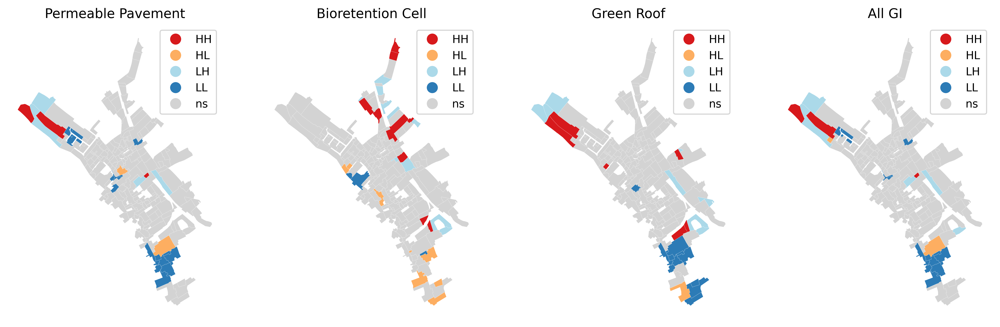

In [110]:
f, ax = plt.subplots(nrows=1, ncols=4, figsize=(16,10),dpi=500)

lisa_cluster(pp_loc['Duration'], rel_res_PP[['Duration','geometry']],ax=ax[0])
lisa_cluster(bc_loc['Duration'], rel_res_BC[['Duration','geometry']],ax=ax[1])
lisa_cluster(gr_loc['Duration'], rel_res_GR[['Duration','geometry']],ax=ax[2])
lisa_cluster(al_loc['Duration'], rel_res_all[['Duration','geometry']],ax=ax[3])

ax[0].set_title('Permeable Pavement')
ax[1].set_title('Bioretention Cell')
ax[2].set_title('Green Roof')
ax[3].set_title('All GI')

plt.savefig('lisa_duration_SF.png')

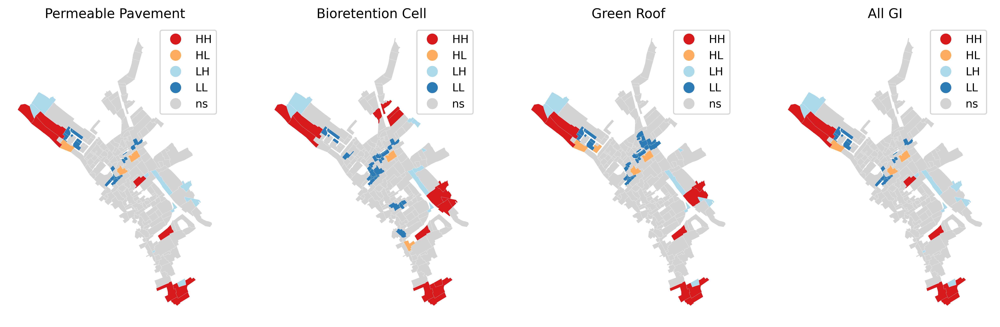

In [111]:
f, ax = plt.subplots(nrows=1, ncols=4, figsize=(16,10),dpi=500)

lisa_cluster(pp_loc['Magnitude'], rel_res_PP[['Magnitude','geometry']],ax=ax[0])
lisa_cluster(bc_loc['Magnitude'], rel_res_BC[['Magnitude','geometry']],ax=ax[1])
lisa_cluster(gr_loc['Magnitude'], rel_res_GR[['Magnitude','geometry']],ax=ax[2])
lisa_cluster(al_loc['Magnitude'], rel_res_all[['Magnitude','geometry']],ax=ax[3])

ax[0].set_title('Permeable Pavement')
ax[1].set_title('Bioretention Cell')
ax[2].set_title('Green Roof')
ax[3].set_title('All GI')

plt.savefig('lisa_magnitude_SF.png')

### Clusters characteristics

1: HH

2: LH

3: LL

4: HL

In [112]:
areas['%Perv']=100*areas['perv_area']/areas['total_area']
areas['%Build']=100*areas['build_area']/areas['total_area']

In [113]:
rel_res_GR['D_quadrant']=gr_loc['Duration'].q
rel_res_GR['D_signifianct']=gr_loc['Duration'].p_sim<0.05

rel_res_PP['D_quadrant']=pp_loc['Duration'].q
rel_res_PP['D_signifianct']=pp_loc['Duration'].p_sim<0.05

rel_res_BC['M_quadrant']=bc_loc['Magnitude'].q
rel_res_BC['M_signifianct']=bc_loc['Magnitude'].p_sim<0.05

rel_res_GR['M_quadrant']=gr_loc['Magnitude'].q
rel_res_GR['M_signifianct']=gr_loc['Magnitude'].p_sim<0.05

In [114]:
info_comparative_D_GR=areas.copy()
info_comparative_D_GR[['Category','significant']]=rel_res_GR[['D_quadrant','D_signifianct']]

In [115]:
info_comparative_D_GR[info_comparative_D_GR['significant']==True].groupby('Category').size()

Category
1     6
2     8
3    15
4     1
dtype: int64

In [116]:
info_comparative_D_GR=info_comparative_D_GR.merge(inputer['subcatchments'][['Name','Area','%Imperv','Slope','Width']])
info_comparative_D_GR.columns

Index(['Unnamed: 0', 'Name', 'geometry', '%Imperv', 'total_area',
       'imperv_area', 'perv_area', 'build_area', '%Perv', '%Build', 'Category',
       'significant', 'Area', 'Slope', 'Width'],
      dtype='object')

In [117]:
tidy_D_GR=info_comparative_D_GR[info_comparative_D_GR['significant']==True].set_index('Category')

# Keep only variables used for clustering
tidy_D_GR = tidy_D_GR[['%Imperv', '%Perv','%Build', 'imperv_area', 'perv_area', 'build_area', 'Area', 'Slope', 'Width']]
tidy_D_GR=tidy_D_GR.rename(columns={'%Imperv':'%Impervious', '%Perv':'%Impervious','%Build':'% Buildings', 'imperv_area':'Impervious area', 'perv_area':'Pervious area', 'build_area':"Buildings Area"})
# Stack column names into a column, obtaining 
# a "long" version of the dataset
tidy_D_GR = tidy_D_GR.stack()
# Take indices into proper columns
tidy_D_GR = tidy_D_GR.reset_index()
# Rename column names
tidy_D_GR = tidy_D_GR.rename(columns={'level_1': 'Attribute', 0: 'Values'})
# Check out result
tidy_D_GR.head()

,Category,Attribute,Values
0,2,%Impervious,78.989247
1,2,%Impervious,21.010753
2,2,% Buildings,7.427517
3,2,Impervious area,7291.300699
4,2,Pervious area,1939.450254


In [126]:
# facets= sns.FacetGrid(data=tidy_D_GR, col='Attribute', hue='quadrant',sharey=False, sharex=False, aspect=2, col_wrap=3)

# # Build the plot as a `sns.kdeplot`
# _ = facets.map(sns.kdeplot, 'Values', shade=True).add_legend(labels=['HH','HL','LL','LH'])

In [119]:
info_comparative_D_PP=areas.copy()
info_comparative_D_PP[['quadrant','significant']]=rel_res_PP[['D_quadrant','D_signifianct']]

info_comparative_D_PP[info_comparative_D_PP['significant']==True].groupby('quadrant').size()

quadrant
1     3
2     5
3    21
4     2
dtype: int64

In [120]:
info_comparative_D_PP=info_comparative_D_PP.merge(inputer['subcatchments'][['Name','Area','%Imperv','Slope','Width']])




In [121]:
info_comparative_M_GR=areas.copy()
info_comparative_M_GR[['quadrant','significant']]=rel_res_GR[['M_quadrant','M_signifianct']]

info_comparative_M_GR[info_comparative_M_GR['significant']==True].groupby('quadrant').size()

quadrant
1     9
2     7
3    26
4     4
dtype: int64

In [122]:
info_comparative_M_BC=areas.copy()
info_comparative_M_BC[['quadrant','significant']]=rel_res_BC[['M_quadrant','M_signifianct']]

info_comparative_M_BC[info_comparative_M_BC['significant']==True].groupby('quadrant').size()

quadrant
1    16
2     8
3    27
4     2
dtype: int64

# CSO

In [131]:
def cso(use_gi):
    cso_gi=dict()

    
    for j in use:
        cso_gi[j]=dict()
        for i in tqdm(storms):
            cso_gi[j][i]=pd.DataFrame()
            for n in tqdm(range(0,len(subcat))):
                cso_gi[j][i][n]=use_gi[j][i][n][3].T[0]
    
    
    return cso_gi

In [132]:
cso_BC=cso(use_BC)
cso_GR=cso(use_GR)
cso_PP=cso(use_PP)
cso_all=cso(use_all)

100%|██████████| 220/220 [00:00<00:00, 2411.04it/s]

100%|██████████| 220/220 [00:00<00:00, 2436.40it/s]

100%|██████████| 220/220 [00:00<00:00, 2428.86it/s]

100%|██████████| 220/220 [00:00<00:00, 2441.76it/s]

100%|██████████| 220/220 [00:00<00:00, 2392.94it/s]

100%|██████████| 220/220 [00:00<00:00, 2412.74it/s]

100%|██████████| 220/220 [00:00<00:00, 2407.62it/s]

100%|██████████| 220/220 [00:00<00:00, 2419.13it/s]

100%|██████████| 220/220 [00:00<00:00, 2424.77it/s]

100%|██████████| 220/220 [00:00<00:00, 2412.72it/s]

100%|██████████| 220/220 [00:00<00:00, 2399.62it/s]

100%|██████████| 220/220 [00:00<00:00, 2408.73it/s]

100%|██████████| 220/220 [00:00<00:00, 2278.60it/s]

100%|██████████| 220/220 [00:00<00:00, 2291.91it/s]

100%|██████████| 220/220 [00:00<00:00, 2302.23it/s]

100%|██████████| 220/220 [00:00<00:00, 2303.25it/s]

100%|██████████| 8/8 [00:00<00:00, 10.31it/s]


In [133]:
cso_BC[0]=dict()
cso_PP[0]=dict()
cso_GR[0]=dict()
cso_all[0]=dict()

for s in storms:
    cso_BC[0][s]=pd.DataFrame(use_BC[0][s][3].T[0])
    cso_PP[0][s]=pd.DataFrame(use_PP[0][s][3].T[0])
    cso_GR[0][s]=pd.DataFrame(use_GR[0][s][3].T[0])
    cso_all[0][s]=pd.DataFrame(use_all[0][s][3].T[0])

### Baseline

In [134]:
baseline_cso=pd.DataFrame()

for s in storms:
    baseline_cso[s]=cso_BC[0][s][0]
    
baseline_cso=baseline_cso.rename(columns={'M2y10h':2,'M5y10h':5,'M10y10h':10,'M30y10h':30,'M50y10h':50,'M100y10h':100,'M1000y10h':1000,'M10000y10h':10000})
baseline_cso=baseline_cso.T

In [135]:
baseline_cso=baseline_cso.reset_index().rename(columns={'index':'%AEP'})

In [136]:
area_duration_cso=np.trapz(x=baseline_cso['%AEP'], y=baseline_cso['duration'])
area_magnitude_cso=np.trapz(x=baseline_cso['%AEP'], y=baseline_cso['severity'])

### Net change resilience 

In [148]:
cso_res_BC=dict()
cso_area_BC=pd.DataFrame()
for sub in range(0,len(subcat)):
    
    cso_res_BC[sub]=pd.DataFrame()
    
    for s in storms:
        cso_res_BC[sub][s]=cso_BC[100][s][sub]
    
    cso_res_BC[sub]=cso_res_BC[sub].rename(columns={'M2y10h':2,'M5y10h':5,'M10y10h':10,'M30y10h':30,'M50y10h':50,'M100y10h':100,'M1000y10h':1000,'M10000y10h':10000})
    cso_res_BC[sub]=cso_res_BC[sub].T
    cso_res_BC[sub]=cso_res_BC[sub].reset_index().rename(columns={'index':'%AEP'})

    dur=100*(area_duration_cso-np.trapz(x=cso_res_BC[sub]['%AEP'], y=cso_res_BC[sub]['duration']))/area_duration_cso
    sev=100*(area_magnitude_cso-np.trapz(x=cso_res_BC[sub]['%AEP'], y=cso_res_BC[sub]['severity']))/area_magnitude_cso

    cso_area_BC[sub]=[dur,sev]

In [149]:
cso_res_PP=dict()
cso_area_PP=pd.DataFrame()
for sub in range(0,len(subcat)):
    
    cso_res_PP[sub]=pd.DataFrame()
    
    for s in storms:
        cso_res_PP[sub][s]=cso_PP[100][s][sub]
    
    cso_res_PP[sub]=cso_res_PP[sub].rename(columns={'M2y10h':2,'M5y10h':5,'M10y10h':10,'M30y10h':30,'M50y10h':50,'M100y10h':100,'M1000y10h':1000,'M10000y10h':10000})
    cso_res_PP[sub]=cso_res_PP[sub].T
    cso_res_PP[sub]=cso_res_PP[sub].reset_index().rename(columns={'index':'%AEP'})

    dur=100*(area_duration_cso-np.trapz(x=cso_res_PP[sub]['%AEP'], y=cso_res_PP[sub]['duration']))/area_duration_cso
    sev=100*(area_magnitude_cso-np.trapz(x=cso_res_PP[sub]['%AEP'], y=cso_res_PP[sub]['severity']))/area_magnitude_cso

    cso_area_PP[sub]=[dur,sev]

In [150]:
cso_res_GR=dict()
cso_area_GR=pd.DataFrame()
for sub in range(0,len(subcat)):
    
    cso_res_GR[sub]=pd.DataFrame()
    
    for s in storms:
        cso_res_GR[sub][s]=cso_GR[100][s][sub]
    
    cso_res_GR[sub]=cso_res_GR[sub].rename(columns={'M2y10h':2,'M5y10h':5,'M10y10h':10,'M30y10h':30,'M50y10h':50,'M100y10h':100,'M1000y10h':1000,'M10000y10h':10000})
    cso_res_GR[sub]=cso_res_GR[sub].T
    cso_res_GR[sub]=cso_res_GR[sub].reset_index().rename(columns={'index':'%AEP'})
    
    dur=100*(area_duration_cso-np.trapz(x=cso_res_GR[sub]['%AEP'], y=cso_res_GR[sub]['duration']))/area_duration_cso
    sev=100*(area_magnitude_cso-np.trapz(x=cso_res_GR[sub]['%AEP'], y=cso_res_GR[sub]['severity']))/area_magnitude_cso

    cso_area_GR[sub]=[dur,sev]

In [151]:
cso_res_all=dict()
cso_area_all=pd.DataFrame()
for sub in range(0,len(subcat)):
    
    cso_res_all[sub]=pd.DataFrame()
    
    for s in storms:
        cso_res_all[sub][s]=cso_all[100][s][sub]
    
    cso_res_all[sub]=cso_res_all[sub].rename(columns={'M2y10h':2,'M5y10h':5,'M10y10h':10,'M30y10h':30,'M50y10h':50,'M100y10h':100,'M1000y10h':1000,'M10000y10h':10000})
    cso_res_all[sub]=cso_res_all[sub].T
    cso_res_all[sub]=cso_res_all[sub].reset_index().rename(columns={'index':'%AEP'})
    
    dur=100*(area_duration_cso-np.trapz(x=cso_res_all[sub]['%AEP'], y=cso_res_all[sub]['duration']))/area_duration_cso
    sev=100*(area_magnitude_cso-np.trapz(x=cso_res_all[sub]['%AEP'], y=cso_res_all[sub]['severity']))/area_magnitude_cso

    cso_area_all[sub]=[dur,sev]

In [152]:
cso_area_BC=cso_area_BC.T.rename(columns={0:'Duration',1:'Magnitude'})
cso_area_BC['geometry']=areas['geometry']
cso_area_BC=gpd.GeoDataFrame(cso_area_BC, crs='EPSG:27700')

cso_area_GR=cso_area_GR.T.rename(columns={0:'Duration',1:'Magnitude'})
cso_area_GR['geometry']=areas['geometry']
cso_area_GR=gpd.GeoDataFrame(cso_area_GR, crs='EPSG:27700')

cso_area_PP=cso_area_PP.T.rename(columns={0:'Duration',1:'Magnitude'})
cso_area_PP['geometry']=areas['geometry']
cso_area_PP=gpd.GeoDataFrame(cso_area_PP, crs='EPSG:27700')

cso_area_all=cso_area_all.T.rename(columns={0:'Duration',1:'Magnitude'})
cso_area_all['geometry']=areas['geometry']
cso_area_all=gpd.GeoDataFrame(cso_area_all, crs='EPSG:27700')

In [304]:
rel_cso_BC=cso_area_BC[['Magnitude','Duration']].copy()
rel_cso_PP=cso_area_PP[['Magnitude','Duration']].copy()
rel_cso_GR=cso_area_GR[['Magnitude','Duration']].copy()
rel_cso_all=cso_area_all[['Magnitude','Duration']].copy()

rel_cso_BC['GI']='BC'
rel_cso_PP['GI']='PP'
rel_cso_GR['GI']='GR'
rel_cso_all['GI']='ALL'

relis_cso=pd.concat([rel_cso_BC,rel_cso_PP,rel_cso_GR,rel_cso_all])

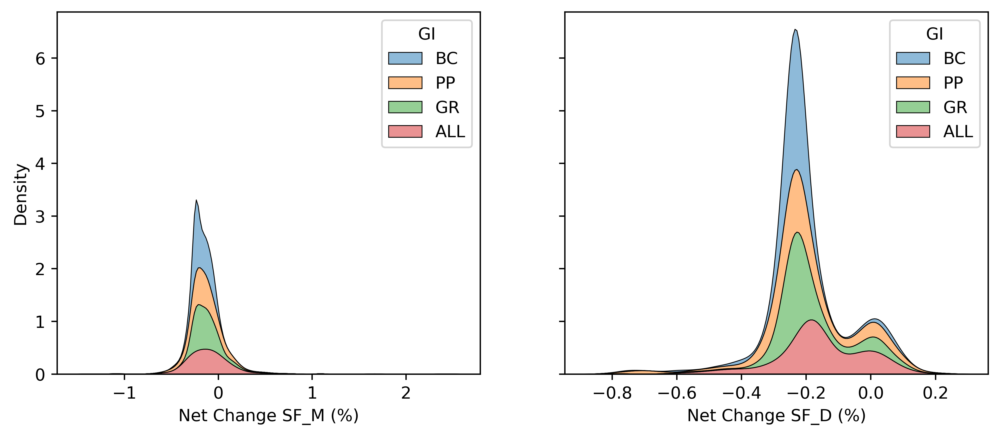

In [306]:
fig,ax=plt.subplots(1,2,dpi=500, sharey=True,figsize=(10,4))

sns.kdeplot(ax=ax[0],data=relis_cso, x='Magnitude',hue='GI',fill=True,multiple='stack',linewidth=0.5, alpha=0.5)
sns.kdeplot(ax=ax[1],data=relis_cso, x='Duration',hue='GI',fill=True,multiple='stack',linewidth=0.5, alpha=0.5)

ax[0].set_xlabel('Net Change SF_M (%)')
ax[1].set_xlabel('Net Change SF_D (%)')

plt.savefig('kdeplot_cso.png')

In [256]:
fig,ax=plt.subplots(1,4, figsize=(35,20), dpi=500)

cso_area_BC.plot(ax=ax[0],column='Duration',scheme='BoxPlot', cmap='coolwarm', legend=True,legend_kwds={'labels':['Low Outliers','>25%','25-50%','50-75%','<75%','Upper Outliers'], 'loc':'lower left', 'fontsize':20})
# ctx.add_basemap(ax[0], crs='EPSG:27700', source=ctx.providers.CartoDB.Voyager)

cso_area_BC.plot(ax=ax[1],column='Duration',scheme='BoxPlot', cmap='coolwarm')

cso_area_PP.plot(ax=ax[2],column='Duration',scheme='BoxPlot', cmap='coolwarm')
# ctx.add_basemap(ax[1], crs='EPSG:27700', source=ctx.providers.CartoDB.Voyager)

cso_area_all.plot(ax=ax[3],column='Duration',scheme='BoxPlot', cmap='coolwarm')
# ctx.add_basemap(ax[1], crs='EPSG:27700', source=ctx.providers.CartoDB.Voyager)

ax[0].set_axis_off()
ax[1].set_axis_off()
ax[2].set_axis_off()
ax[3].set_axis_off()
ax[0].set_title('Permeable Pavement',fontsize=30)
ax[1].set_title('Bioretention Cell',fontsize=30)
ax[2].set_title('Green Roof',fontsize=30)
ax[3].set_title('All GI',fontsize=30)

plt.savefig('boxplot_duration_cso.png')

In [182]:
cso_area_BC.describe()

,Duration,Magnitude
count,220.000000,220.000000
mean,-0.232915,-0.185023
std,0.085368,0.087274
min,-0.755548,-0.487148
25%,-0.246261,-0.248728
50%,-0.230390,-0.206436
75%,-0.229201,-0.116721
max,0.082897,0.035819


In [257]:
fig,ax=plt.subplots(1,4, figsize=(35,20), dpi=500)

cso_area_BC.plot(ax=ax[0],column='Magnitude',scheme='BoxPlot', cmap='coolwarm', legend=True, legend_kwds={'labels':['Low Outliers','>25%','25-50%','50-75%','<75%'], 'loc':'lower left', 'fontsize':20})
# ctx.add_basemap(ax[0], crs='EPSG:27700', source=ctx.providers.CartoDB.Voyager)

cso_area_BC.plot(ax=ax[1],column='Magnitude',scheme='BoxPlot', cmap='coolwarm')

cso_area_PP.plot(ax=ax[2],column='Magnitude',scheme='BoxPlot', cmap='coolwarm',legend=True, legend_kwds={'labels':['Low Outliers','>25%','25-50%','50-75%','<75%','Upper Outliers'], 'loc':'lower left', 'fontsize':20})
# ctx.add_basemap(ax[1], crs='EPSG:27700', source=ctx.providers.CartoDB.Voyager)

cso_area_all.plot(ax=ax[3],column='Magnitude',scheme='BoxPlot', cmap='coolwarm')
# ctx.add_basemap(ax[1], crs='EPSG:27700', source=ctx.providers.CartoDB.Voyager)

ax[0].set_axis_off()
ax[1].set_axis_off()
ax[2].set_axis_off()
ax[3].set_axis_off()
ax[0].set_title('Permeable Pavement',fontsize=30)
ax[1].set_title('Bioretention Cell',fontsize=30)
ax[2].set_title('Green Roof',fontsize=30)
ax[3].set_title('All GI',fontsize=30)

plt.savefig('boxplot_magnitude_cso.png')

In [185]:
weights_all=dict()

w_queen=weights.Queen.from_dataframe(cso_area_BC)
w_queen.transform='R'
weights_all['queen']=w_queen

w_rook=weights.Rook.from_dataframe(cso_area_BC)
w_rook.transform='R'
weights_all['rook']=w_rook

w_KNN=weights.KNN.from_dataframe(cso_area_BC,k=4)
weights_all['KNN_4']=w_KNN

w_KNN_6=weights.KNN.from_dataframe(cso_area_BC,k=6)
weights_all['KNN_6']=w_KNN_6

weight_list=['queen','rook','KNN_4','KNN_6']

('WARNING: ', 72, ' is an island (no neighbors)')
('WARNING: ', 72, ' is an island (no neighbors)')


/home/links/mr604/anaconda3/envs/geogeo/lib/python3.6/site-packages/pysal/weights/weights.py:186: UserWarning: There is one disconnected observation (no neighbors)
  warnings.warn("There is one disconnected observation (no neighbors)")
/home/links/mr604/anaconda3/envs/geogeo/lib/python3.6/site-packages/pysal/weights/weights.py:187: UserWarning: Island id: 72
  warnings.warn("Island id: %s" % str(self.islands[0]))


In [205]:
mag_cso=pd.DataFrame()
dur_cso=pd.DataFrame()

bc_cso=dict()
pp_cso=dict()
gr_cso=dict()
all_cso=dict()

for i in indicators:
    bc_cso[i]=dict()
    pp_cso[i]=dict()
    gr_cso[i]=dict()
    all_cso[i]=dict()
    for ws in weight_list:
        bc_cso[i][ws]=esda.Moran(cso_area_BC[i], weights_all[ws])
        pp_cso[i][ws]=esda.Moran(cso_area_PP[i], weights_all[ws])
        gr_cso[i][ws]=esda.Moran(cso_area_GR[i], weights_all[ws])
        all_cso[i][ws]=esda.Moran(cso_area_all[i], weights_all[ws])
        
        

for ws in weight_list:
    mag_cso[f'BC{ws}']=[bc_cso['Magnitude'][ws].I,bc_cso['Magnitude'][ws].p_sim]
    mag_cso[f'PP{ws}']=[pp_cso['Magnitude'][ws].I,pp_cso['Magnitude'][ws].p_sim]
    mag_cso[f'GR{ws}']=[gr_cso['Magnitude'][ws].I,gr_cso['Magnitude'][ws].p_sim]
    mag_cso[f'ALL{ws}']=[all_cso['Magnitude'][ws].I,all_cso['Magnitude'][ws].p_sim]

    dur_cso[f'BC{ws}']=[bc_cso['Duration'][ws].I,bc_cso['Duration'][ws].p_sim]
    dur_cso[f'PP{ws}']=[pp_cso['Duration'][ws].I,pp_cso['Duration'][ws].p_sim]
    dur_cso[f'GR{ws}']=[gr_cso['Duration'][ws].I,gr_cso['Duration'][ws].p_sim]
    dur_cso[f'ALL{ws}']=[all_cso['Duration'][ws].I,all_cso['Duration'][ws].p_sim]

In [207]:
mag_cso.T

,0,1
BCqueen,0.168267,0.001
PPqueen,-0.051758,0.125
GRqueen,0.053731,0.092
ALLqueen,-0.019567,0.379
BCrook,0.172088,0.001
PProok,-0.047485,0.159
GRrook,0.053197,0.104
ALLrook,-0.018316,0.363
BCKNN_4,0.199129,0.001
PPKNN_4,0.059209,0.071


In [198]:
## GLOBAL & LOCAL 

In [208]:
w=weights.KNN.from_dataframe(cso_area_BC,k=5)

In [209]:
mag_cso=pd.DataFrame()
dur_cso=pd.DataFrame()

bc_cso=dict()
pp_cso=dict()
gr_cso=dict()
all_cso=dict()

for i in indicators:
    bc_cso[i]=esda.Moran(cso_area_BC[i], w)
    pp_cso[i]=esda.Moran(cso_area_PP[i], w)
    gr_cso[i]=esda.Moran(cso_area_GR[i], w)
    all_cso[i]=esda.Moran(cso_area_all[i], w)

mag_cso['BC']=[bc_cso['Magnitude'].I,bc_cso['Magnitude'].p_sim]
mag_cso['PP']=[pp_cso['Magnitude'].I,pp_cso['Magnitude'].p_sim]
mag_cso['GR']=[gr_cso['Magnitude'].I,gr_cso['Magnitude'].p_sim]
mag_cso['ALL']=[all_cso['Magnitude'].I,all_cso['Magnitude'].p_sim]

dur_cso['BC']=[bc_cso['Duration'].I,bc_cso['Duration'].p_sim]
dur_cso['PP']=[pp_cso['Duration'].I,pp_cso['Duration'].p_sim]
dur_cso['GR']=[gr_cso['Duration'].I,gr_cso['Duration'].p_sim]
dur_cso['ALL']=[all_cso['Duration'].I,all_cso['Duration'].p_sim]

In [211]:
dur_cso.T

,0,1
BC,0.043966,0.107
PP,0.002869,0.427
GR,-0.045103,0.153
ALL,0.195290,0.001


In [212]:
bc_loc_cso=dict()
pp_loc_cso=dict()
gr_loc_cso=dict()
all_loc_cso=dict()

for i in indicators:
    bc_loc_cso[i]=esda.Moran_Local(cso_area_BC[i], w)
    pp_loc_cso[i]=esda.Moran_Local(cso_area_PP[i], w)
    gr_loc_cso[i]=esda.Moran_Local(cso_area_GR[i], w)
    all_loc_cso[i]=esda.Moran_Local(cso_area_all[i], w)

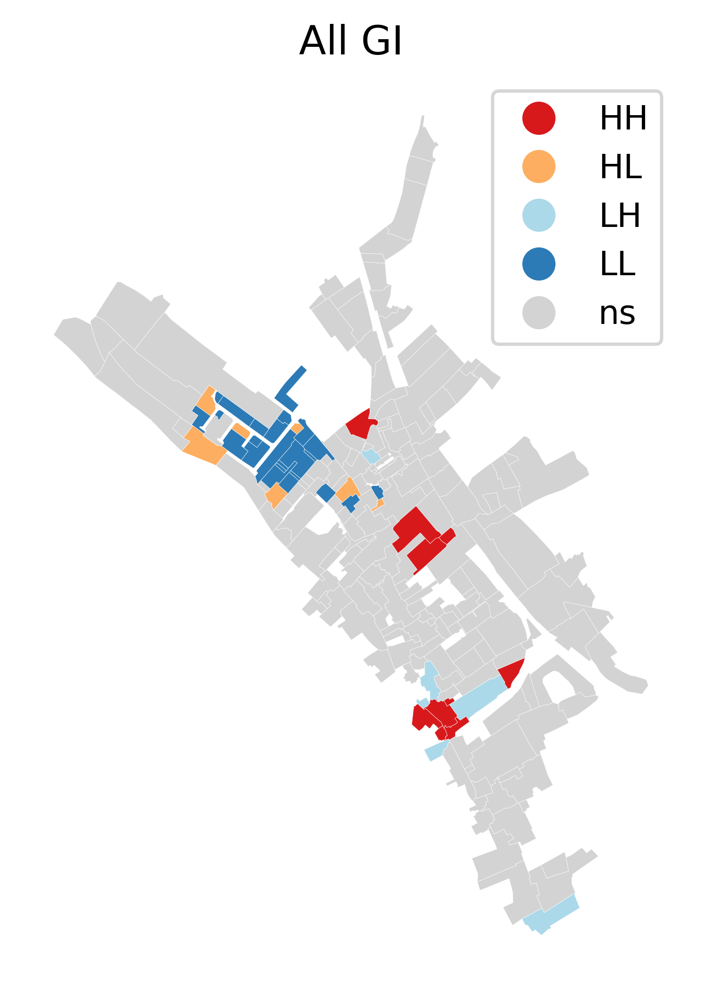

In [230]:
f, ax = plt.subplots(figsize=(15,5), dpi=500)

# lisa_cluster(pp_loc_cso['Duration'], cso_area_PP[['Duration','geometry']],ax=ax[0])
# lisa_cluster(bc_loc_cso['Duration'], cso_area_BC[['Duration','geometry']],ax=ax[1])
# lisa_cluster(gr_loc_cso['Duration'], cso_area_GR[['Duration','geometry']],ax=ax[2])
lisa_cluster(all_loc_cso['Duration'], cso_area_GR[['Duration','geometry']],ax=ax)

# ax[0].set_title('Permeable Pavement')
# ax[1].set_title('Bioretention Cell')
# ax[2].set_title('Green Roof')
ax.set_title('All GI')

plt.savefig('lisa_duration_cso.png')

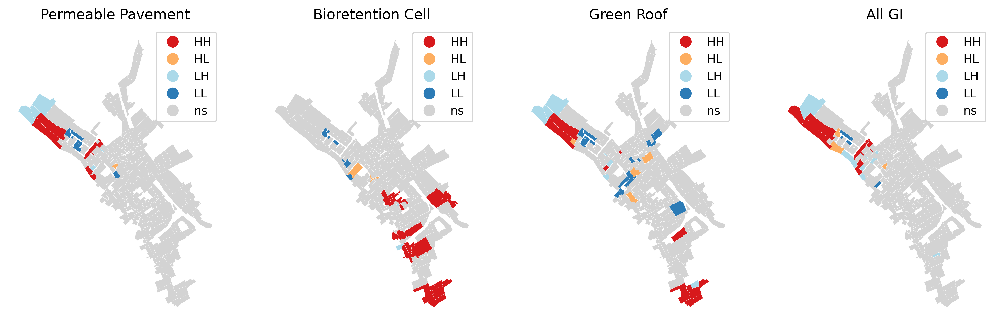

In [226]:
f, ax = plt.subplots(1,4, figsize=(15,5), dpi=500)

lisa_cluster(pp_loc_cso['Magnitude'], cso_area_PP[['Magnitude','geometry']],ax=ax[0])
lisa_cluster(bc_loc_cso['Magnitude'], cso_area_BC[['Magnitude','geometry']],ax=ax[1])
lisa_cluster(gr_loc_cso['Magnitude'], cso_area_BC[['Magnitude','geometry']],ax=ax[2])
lisa_cluster(all_loc_cso['Magnitude'], cso_area_GR[['Magnitude','geometry']],ax=ax[3])

ax[0].set_title('Permeable Pavement')
ax[1].set_title('Bioretention Cell')
ax[2].set_title('Green Roof')
ax[3].set_title('All GI')
# ax[1].set_title('Green Roof')

plt.savefig('lisa_magnitude_cso.png')

In [238]:
cso_area_BC['M_quadrant']=bc_loc_cso['Magnitude'].q
cso_area_BC['M_signifianct']=bc_loc_cso['Magnitude'].p_sim<0.05

info_comparative_cso=areas.copy()
info_comparative_cso[['quadrant','significant']]=cso_area_BC[['M_quadrant','M_signifianct']]
info_comparative_cso[info_comparative_cso['significant']==True].groupby('quadrant').size()

quadrant
1    20
2     2
3     7
4     2
dtype: int64